## Transfer Learning- CNN (Baseline), ResNet-50, VGG-16, VGG-19 using Keras

#Problem Statement

Classification of different types of cars depending on their brands. Here I have a dataset which consists of 3 brands of car images and I need to train a model inorder to classify the cars depending on their brands and with a better accuracy.

In [1]:
# import the libraries as shown below

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet50 import ResNet50
#from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.models import Sequential
import numpy as np
from glob import glob
import matplotlib.pyplot as ply 
from random import sample

In [2]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.5
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

In [3]:
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!unzip /content/drive/MyDrive/Train.zip -d /content/Train 
!unzip /content/drive/MyDrive/Test.zip -d /content/Test

Archive:  /content/drive/MyDrive/Train.zip
  inflating: /content/Train/Train/mercedes/19.jpg  
  inflating: /content/Train/Train/mercedes/2.jpg  
  inflating: /content/Train/Train/mercedes/18.jpg  
  inflating: /content/Train/Train/mercedes/15.jpg  
  inflating: /content/Train/Train/mercedes/17.jpg  
  inflating: /content/Train/Train/mercedes/10.jpg  
  inflating: /content/Train/Train/mercedes/11.jpg  
  inflating: /content/Train/Train/mercedes/1.jpg  
  inflating: /content/Train/Train/mercedes/14.jpg  
  inflating: /content/Train/Train/mercedes/13.jpg  
  inflating: /content/Train/Train/mercedes/12.jpg  
  inflating: /content/Train/Train/mercedes/16.jpg  
  inflating: /content/Train/Train/mercedes/23.jpg  
  inflating: /content/Train/Train/mercedes/25.jpg  
  inflating: /content/Train/Train/mercedes/24.jpg  
  inflating: /content/Train/Train/mercedes/21.jpg  
  inflating: /content/Train/Train/mercedes/22.jpg  
  inflating: /content/Train/Train/mercedes/20.jpg  
  inflating: /content/T

In [5]:
import glob 
# Returns a list of names in list files. 
print("Using glob.glob()")
files = glob.glob('/content/Train/Train/**/*.jpg',  
                   recursive = True)
for file in files:
    print(file)

Using glob.glob()
/content/Train/Train/mercedes/6.jpg
/content/Train/Train/mercedes/3.jpg
/content/Train/Train/mercedes/14.jpg
/content/Train/Train/mercedes/8.jpf.jpg
/content/Train/Train/mercedes/25.jpg
/content/Train/Train/mercedes/7.jpg
/content/Train/Train/mercedes/11.jpg
/content/Train/Train/mercedes/17.jpg
/content/Train/Train/mercedes/22.jpg
/content/Train/Train/mercedes/5.jpg
/content/Train/Train/mercedes/1.jpg
/content/Train/Train/mercedes/13.jpg
/content/Train/Train/mercedes/4.jpg
/content/Train/Train/mercedes/12.jpg
/content/Train/Train/mercedes/18.jpg
/content/Train/Train/mercedes/24.jpg
/content/Train/Train/mercedes/9.jpg
/content/Train/Train/mercedes/20.jpg
/content/Train/Train/mercedes/10.jpg
/content/Train/Train/mercedes/19.jpg
/content/Train/Train/mercedes/15.jpg
/content/Train/Train/mercedes/16.jpg
/content/Train/Train/mercedes/2.jpg
/content/Train/Train/mercedes/23.jpg
/content/Train/Train/mercedes/21.jpg
/content/Train/Train/audi/6.jpg
/content/Train/Train/audi/3.jp

In [6]:
import glob 
# Returns a list of names in list files. 
print("Using glob.glob()")
files = glob.glob('/content/Test/Test/**/*.jpg',  
                   recursive = True)
for file in files:
    print(file)

Using glob.glob()
/content/Test/Test/mercedes/45.jpg
/content/Test/Test/mercedes/29.jpg
/content/Test/Test/mercedes/27.jpg
/content/Test/Test/mercedes/37.jpg
/content/Test/Test/mercedes/33.jpg
/content/Test/Test/mercedes/40.jpg
/content/Test/Test/mercedes/39.jpg
/content/Test/Test/mercedes/32.jpg
/content/Test/Test/mercedes/38.jpg
/content/Test/Test/mercedes/41.jpg
/content/Test/Test/mercedes/34.jpg
/content/Test/Test/mercedes/44.jpg
/content/Test/Test/mercedes/30.jpg
/content/Test/Test/mercedes/35.jpg
/content/Test/Test/mercedes/31.jpg
/content/Test/Test/mercedes/28.jpg
/content/Test/Test/mercedes/36.jpg
/content/Test/Test/mercedes/42.jpg
/content/Test/Test/mercedes/43.jpg
/content/Test/Test/audi/26.jpg
/content/Test/Test/audi/25.jpg
/content/Test/Test/audi/29.jpg
/content/Test/Test/audi/27.jpg
/content/Test/Test/audi/22.jpg
/content/Test/Test/audi/24.jpg
/content/Test/Test/audi/28.jpg
/content/Test/Test/audi/23.jpg
/content/Test/Test/audi/21.jpg
/content/Test/Test/lamborghini/6.jpg
/

In [7]:
# re-size all the images to this
IMAGE_SIZE = [224, 224]

train_path = '/content/Train/Train'
valid_path = '/content/Test/Test'

#Data Preprocessing and Exploratory Data Analysis and Observations

First of all I need to check does each of the classes contain equal number of images ; that is if the dataset is balanced or not.

In [8]:
import os
dir_path = "/content/Train/Train"
categories=[]
class_counts=[]
for i in os.listdir(dir_path):
    print("No of Images in ",i," category is ",len(os.listdir(os.path.join(dir_path,i))))
    categories.append(i)
    class_counts.append(len(os.listdir(os.path.join(dir_path,i))))

No of Images in  mercedes  category is  25
No of Images in  audi  category is  20
No of Images in  lamborghini  category is  19


In [9]:
import os
dir_path1 = "/content/Test/Test"
categories=[]
class_counts=[]
for i in os.listdir(dir_path1):
    print("No of Images in ",i," category is ",len(os.listdir(os.path.join(dir_path,i))))
    categories.append(i)
    class_counts.append(len(os.listdir(os.path.join(dir_path,i))))

No of Images in  mercedes  category is  25
No of Images in  audi  category is  20
No of Images in  lamborghini  category is  19


We would also check through the visualization if the dataset is balanced

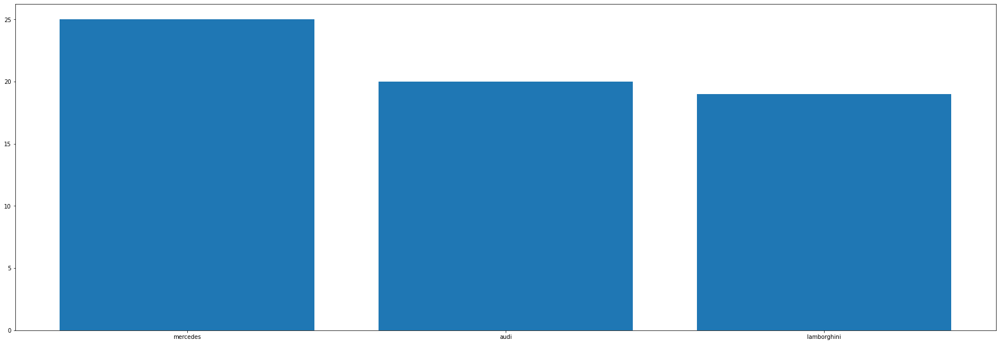

In [10]:
import matplotlib.pyplot as plt
fig = plt.figure()
ax = fig.add_axes([4,4,4,2])
langs = categories
students = class_counts
ax.bar(langs,students)
plt.show()

In [11]:
!pip install basic_image_eda 

from basic_image_eda import BasicImageEDA

if __name__ == "__main__":  # for multiprocessing
    data_dir = "/content/Train/Train"
    BasicImageEDA.explore(data_dir)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

found 64 images.
Using 2 threads. (max:2)



100%|██████████| 64/64 [00:00<00:00, 221.94it/s]



*--------------------------------------------------------------------------------------*
number of images                         |  64

dtype                                    |  uint8
channels                                 |  [3]
extensions                               |  ['jpg']

min height                               |  146
max height                               |  221
mean height                              |  180.984375
median height                            |  183

min width                                |  228
max width                                |  345
mean width                               |  279.296875
median width                             |  275

mean height/width ratio                  |  0.648
median height/width ratio                |  0.6654545454545454
recommended input size(by mean)          |  [184 280] (h x w, multiples of 8)
recommended input size(by mean)          |  [176 272] (h x w, multiples of 16)
recommended input size(by mean)          

Now we will try to display an image and look at it

In [12]:
train = {}
test = {}


# Make dictionary storing images for each category under train data.

for i in os.listdir(dir_path):
    train[i] = os.listdir(os.path.join(dir_path, i))

# Make dictionary storing images for each category under test data.


for i in os.listdir(dir_path1):
    test[i] = os.listdir(os.path.join(dir_path1, i))

In [13]:
# View the number of images in the entire training and testing datasets respectively.
len_train = np.concatenate(list(train.values())).shape[0]
len_test = np.concatenate(list(test.values())).shape[0]

print("Number of images in training data : {}".format(len_train))
print("Number of images in testing data : {}".format(len_test))

Number of images in training data : 64
Number of images in testing data : 58


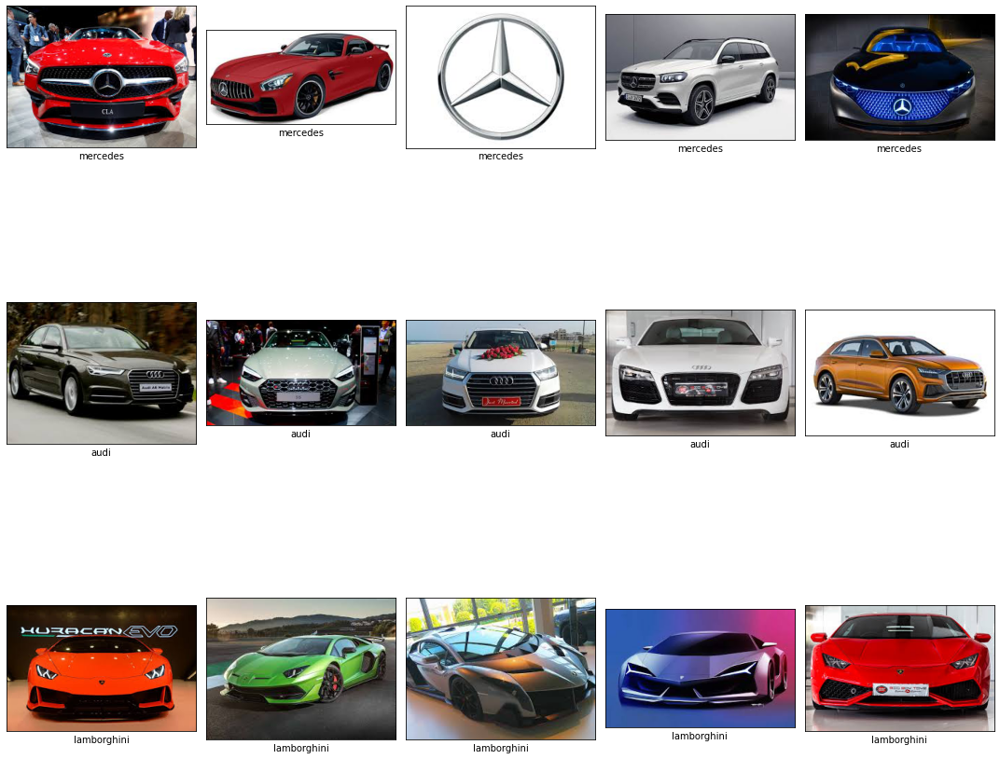

In [17]:
# Randomly display 5 images under each of the 3 categories from the training data.
# You will see different images each time.

fig, axs = plt.subplots(3, 5, figsize = (15, 15))
for i, item in enumerate(os.listdir(dir_path)):
    images = sample(train[item], 5)
    
    for j, image in enumerate(images):
        img = PIL.Image.open(os.path.join(dir_path, item, image))
        axs[i, j].imshow(img)
        axs[i, j].set(xlabel = item, xticks = [], yticks = [])

fig.tight_layout()

In [18]:
# View the number of images in each of the 6 categories in the training data.
for item in train.keys():
    print(item, len(train[item]))

mercedes 25
audi 20
lamborghini 19


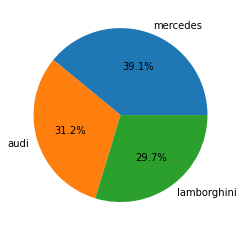

In [19]:
# Make a pie-chart to visualize the percentage contribution of each category.
# This is often useful when you want your dataset to be balanced.
fig, ax = plt.subplots()
ax.pie(
    [len(train[item]) for item in train],
    labels = train.keys(),
    autopct = "%1.1f%%"
)
fig.show()

uint8
(183, 275, 3)


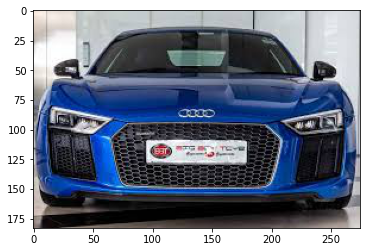

In [16]:
# load and display an image with Matplotlib
from matplotlib import image
from matplotlib import pyplot
# load image as pixel array
data = image.imread('/content/Train/Train/audi/1.jpg')
# summarize shape of the pixel array
print(data.dtype)
print(data.shape)
# display the array of pixels as an image
pyplot.imshow(data)
pyplot.show()

Using Pillow library to visualize images:

In [15]:
import os

import imageio
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import pandas as pd
import PIL
from PIL import Image
import skimage
import skimage.color

%matplotlib inline

Original image bounding box: (0, 0, 275, 183)
Post-crop bounding box: (0, 0, 150, 100)
Post-resize bounding box: (0, 0, 600, 400)


Text(0.5, 1.0, 'Image after cropping, resizing and rotating')

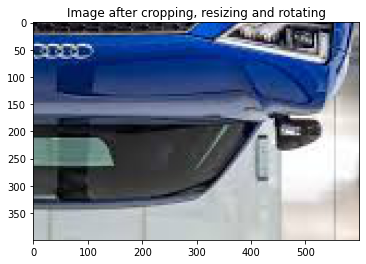

In [20]:
img_path="/content/Train/Train/audi/1.jpg"
img = PIL.Image.open(img_path)# Print bounding box
print('Original image bounding box:', img.getbbox())# Cropping
img = img.crop((0, 0, 150, 100))# Print bounding box
print('Post-crop bounding box:', img.getbbox())# Resize
img = img.resize((600, 400), resample=PIL.Image.NEAREST)# Print bounding box
print('Post-resize bounding box:', img.getbbox())# Rotate image
img = img.rotate(180)# Show
plt.imshow(img)
plt.title('Image after cropping, resizing and rotating')

Displaying the original size of the image

(275, 183)


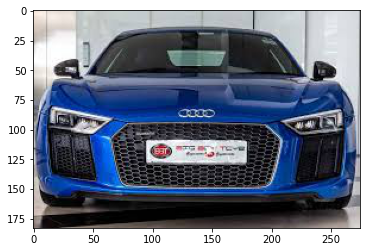

In [21]:
# create a thumbnail of an image
from PIL import Image
# load the image
image = Image.open('/content/Train/Train/audi/1.jpg')
# report the size of the image
print(image.size)
pyplot.imshow(data)
pyplot.show()

Text(0.5, 1.0, 'Original image')

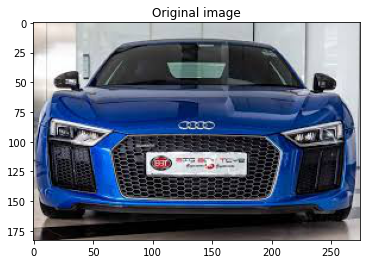

In [22]:
img_path="/content/Train/Train/audi/1.jpg"
img = mpimg.imread(img_path)
plt.imshow(img)
plt.title('Original image')

Visualizing in gray scale

Text(0.5, 1.0, 'Grayscale')

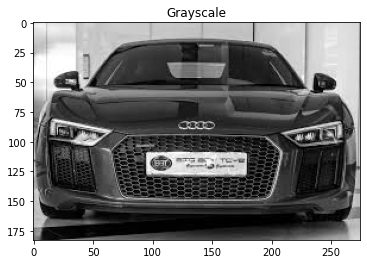

In [23]:
img_gray = skimage.color.rgb2gray(img)
plt.imshow(img_gray, cmap='gray')
plt.title('Grayscale')

#Importing the necessary libraries

In [24]:
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
import numpy as np
from glob import glob
import matplotlib.pyplot as plt

In [25]:
# reference- from my callbacks assignment
import warnings
warnings.filterwarnings("ignore")
import pandas as pd 
from tensorflow import keras
import numpy as np 
import pandas as pd 
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import OneHotEncoder 
import tensorflow as tf 
from sklearn.metrics import roc_auc_score 
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score 
import matplotlib.pyplot as plt 
from tqdm import tqdm 
import datetime
import keras 
from sklearn.preprocessing import StandardScaler 
from sklearn.feature_extraction.text import TfidfVectorizer 
from keras.models import Sequential 
from keras.layers import Dense, Activation 
from keras.initializers import RandomUniform 
from keras import initializers, optimizers
from keras.utils import np_utils 
from keras.callbacks import ModelCheckpoint, EarlyStopping,LearningRateScheduler,TensorBoard

In [26]:
# tensor-board in colab
# Refer: https://www.tensorflow.org/tensorboard/get_started
import os
import datetime

! rm -rf ./logs/ 
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
print(logdir)
%load_ext tensorboard
# %tensorboard --logdir $logdir

logs/20230323-105156


In [27]:
class TerminateNaN(tf.keras.callbacks.Callback):
        
    def on_epoch_end(self, epoch, logs={}):
        loss = logs.get('loss')
#         weights=model1.get_weights()
        w=self.model.trainable_weights
        if loss is not None:
            if np.isnan(loss) or np.isinf(loss) or w==None:
                print("Invalid loss and terminated at epoch {}".format(epoch))
                self.model.stop_training = Tru

In [28]:
#https://stackoverflow.com/questions/41032551/how-to-compute-receiving-operating-characteristic-roc-and-auc-in-keras
from sklearn.metrics import roc_auc_score
from keras.callbacks import Callback
class RocCallback(Callback):
    def __init__(self,training_data,validation_data):
        self.x = training_data[0]
        self.y = training_data[1]
        self.x_val = validation_data[0]
        self.y_val = validation_data[1]


    def on_train_begin(self, logs={}):
        return

    def on_train_end(self, logs={}):
        return

    def on_epoch_begin(self, epoch, logs={}):
        return

    def on_epoch_end(self, epoch, logs={}):
        y_pred_train = self.model.predict_proba(self.x)
        roc_train = roc_auc_score(self.y, y_pred_train)
        y_pred_val = self.model.predict_proba(self.x_val)
        roc_val = roc_auc_score(self.y_val, y_pred_val)
        print('\rroc-auc_train: %s - roc-auc_val: %s' % (str(round(roc_train,4)),str(round(roc_val,4))),end=100*' '+'\n')
        return

    def on_batch_begin(self, batch, logs={}):
        return

    def on_batch_end(self, batch, logs={}):
        return

In [29]:
terminate = TerminateNaN()

# https://medium.com/@italojs/saving-your-weights-for-each-epoch-keras-callbacks-b494d9648202
checkpoint = ModelCheckpoint("best_model1.hdf5", monitor='accuracy', verbose=1,
save_best_only=True, mode='auto', period=1)

# # set early stopping monitor so the model stops training when it won't improve anymore
early_stopping_monitor = EarlyStopping(patience=3)

# Tensorbaor
! rm -rf ./logs/ 
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
%tensorboard --logdir $logdir


tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

optimizer=tf.keras.optimizers.SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)

<IPython.core.display.Javascript object>

ValueError: ignored

In [30]:
import math
def step_decay(epoch):
   lrate = 0.1
   drop = 0.05
   epochs_drop = 3.0
   if epoch % 3==0:
       lrate =  lrate * math.pow(drop,math.floor((1+epoch)/epochs_drop))
           
   else:
        lrate=lrate
   return lrate
lrate = LearningRateScheduler(step_decay)

#Model Implementation

#1). CNN classifier

In [ ]:
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation, BatchNormalization
from tensorflow.keras.models import Sequential

In [ ]:
model_c = Sequential([     
    
# First convolution        
Conv2D(16, (3,3), activation='relu', input_shape=(224, 224, 3)),        
MaxPooling2D(2, 2),        
 
# Second convolution        
Conv2D(32, (3,3), activation='relu'),        
MaxPooling2D(2,2),     
   
# Third convolution        
Conv2D(64, (3,3), activation='relu'),        
MaxPooling2D(2,2),            
Flatten(),        

# Dense hidden layer        
Dense(512, activation='relu'),        
Dropout(0.2),        
 
#Output neuron.         
Dense(3, activation='softmax') ])

In [ ]:
model_c.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# view the structure of the model
model_c.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 64)       0

In [ ]:
model_c.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
# Use the Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

Image preprocessing and Augmentation:

Here we will try to make our data invariant to all the variances like flip variance,rotational variance,scaling and zooming variance.
Here we are doing the augmentation only for the train data and we are only doing the scaling for test_data

Train and test split of data:

Now we will try to provide our data from our folders as train and test data

In [ ]:
# Make sure you provide the same target size as initialied for the image size
training_set = train_datagen.flow_from_directory('/content/Train/Train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 64 images belonging to 3 classes.


In [ ]:
test_set = test_datagen.flow_from_directory('/content/Test/Test',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 58 images belonging to 3 classes.


In [ ]:
# Fetch the data and the labels 
x_train, y_train = next(training_set)
x_test, y_test  = next(test_set)

In [ ]:
c = model_c.fit_generator(
  training_set,
  validation_data=test_set,
  epochs=20,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set)
)

Epoch 1/20
2/2 [==============================] - 4s 2s/step - loss: 2.6930 - accuracy: 0.4062 - val_loss: 3.0725 - val_accuracy: 0.1552
Epoch 2/20
2/2 [==============================] - 3s 2s/step - loss: 2.1009 - accuracy: 0.2812 - val_loss: 1.0630 - val_accuracy: 0.5172
Epoch 3/20
2/2 [==============================] - 3s 2s/step - loss: 1.2552 - accuracy: 0.2969 - val_loss: 1.0091 - val_accuracy: 0.5172
Epoch 4/20
2/2 [==============================] - 3s 2s/step - loss: 1.0548 - accuracy: 0.3906 - val_loss: 1.0533 - val_accuracy: 0.4655
Epoch 5/20
2/2 [==============================] - 3s 2s/step - loss: 1.0304 - accuracy: 0.4219 - val_loss: 1.0840 - val_accuracy: 0.3621
Epoch 6/20
2/2 [==============================] - 3s 2s/step - loss: 1.0003 - accuracy: 0.4688 - val_loss: 1.0888 - val_accuracy: 0.3103
Epoch 7/20
2/2 [==============================] - 3s 2s/step - loss: 0.9645 - accuracy: 0.5469 - val_loss: 1.0431 - val_accuracy: 0.5345
Epoch 8/20
2/2 [=========================

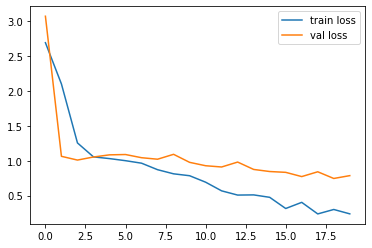

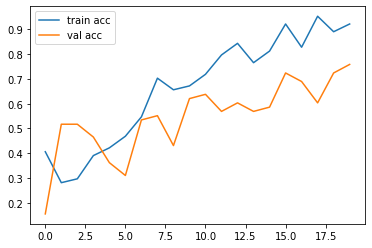

<Figure size 432x288 with 0 Axes>

In [ ]:
# plot the loss
plt.plot(c.history['loss'], label='train loss')
plt.plot(c.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

# plot the accuracy
plt.plot(c.history['accuracy'], label='train acc')
plt.plot(c.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

In [ ]:

# save it as a h5 file


from tensorflow.keras.models import load_model

model_c.save('model_cnn.h5')

In [ ]:

y_pred = model_c.predict(test_set)

2/2 [==============================] - 1s 261ms/step


In [ ]:
y_pred

array([[3.22957337e-01, 2.43638735e-03, 6.74606264e-01],
       [6.14769742e-05, 9.99152660e-01, 7.85837823e-04],
       [1.50501147e-01, 1.77748241e-02, 8.31724048e-01],
       [3.25655943e-04, 9.99175072e-01, 4.99308167e-04],
       [1.71897584e-03, 9.82862473e-01, 1.54186198e-02],
       [9.99927223e-01, 7.07178106e-06, 6.56678167e-05],
       [9.52555129e-05, 9.97618318e-01, 2.28630006e-03],
       [3.09256148e-02, 9.36727077e-02, 8.75401616e-01],
       [1.01362363e-01, 4.47204649e-01, 4.51432973e-01],
       [1.81357399e-01, 6.01591945e-01, 2.17050657e-01],
       [6.81603514e-03, 8.87343466e-01, 1.05840549e-01],
       [8.45925824e-04, 9.99111176e-01, 4.29014981e-05],
       [1.89513157e-04, 9.98833835e-01, 9.76568554e-04],
       [2.36274794e-01, 7.45411575e-01, 1.83136202e-02],
       [8.56228247e-02, 3.48072469e-01, 5.66304684e-01],
       [1.37869358e-01, 5.51395178e-01, 3.10735524e-01],
       [3.34632350e-04, 9.96223986e-01, 3.44129023e-03],
       [8.49531989e-06, 9.98876

In [ ]:
# CNN model
loss, acc = model_c.evaluate(test_set, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

2/2 - 2s - loss: 1.0080 - accuracy: 0.5690 - 2s/epoch - 888ms/step
Restored model, accuracy: 56.90%


#Now we will try to implement our Transfer Learning Models

Here we will try to convert the image size as image_size+3 so that we will get our RGB implementation here as our three layers
Here we will use the weights of our Imagenet from our pretrained Resnet50 model

#2). ResNet-50 classifier

In [ ]:
# Import the Vgg 16 library as shown below and add preprocessing layer to the front of VGG
# Here we will be using imagenet weights

resnet = ResNet50(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

94765736/94765736 [==============================] - 1s 0us/step


In [ ]:
# don't train existing weights
for layer in resnet.layers:
    layer.trainable = False

In [ ]:
# useful for getting number of output classes
folders = glob('/content/Train/Train/*')
folders

['/content/Train/Train/audi',
 '/content/Train/Train/mercedes',
 '/content/Train/Train/lamborghini']

In [ ]:
len(folders)

3

In [ ]:
# our layers - you can add more if you want
x = Flatten()(resnet.output)

In [ ]:
prediction = Dense(len(folders), activation='softmax')(x)

# create a model object
model = Model(inputs=resnet.input, outputs=prediction)

In [ ]:

# view the structure of the model
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [ ]:
# tell the model what cost and optimization method to use
model.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)

In [ ]:
# Use the Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

In [ ]:
# Make sure you provide the same target size as initialied for the image size
training_set = train_datagen.flow_from_directory('/content/Train/Train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 64 images belonging to 3 classes.


In [ ]:
test_set = test_datagen.flow_from_directory('/content/Test/Test',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 58 images belonging to 3 classes.


In [ ]:
# fit the model
# Run the cell. It will take some time to execute
r = model.fit_generator(
  training_set,
  validation_data=test_set,
  epochs=50,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set)
)

Epoch 1/50
2/2 [==============================] - 40s 27s/step - loss: 8.2624 - accuracy: 0.2969 - val_loss: 9.2234 - val_accuracy: 0.3276
Epoch 2/50
2/2 [==============================] - 41s 29s/step - loss: 4.5956 - accuracy: 0.4375 - val_loss: 4.4971 - val_accuracy: 0.5172
Epoch 3/50
2/2 [==============================] - 34s 26s/step - loss: 5.6491 - accuracy: 0.3750 - val_loss: 6.1340 - val_accuracy: 0.5172
Epoch 4/50
2/2 [==============================] - 35s 27s/step - loss: 5.8031 - accuracy: 0.4219 - val_loss: 3.7256 - val_accuracy: 0.1552
Epoch 5/50
2/2 [==============================] - 46s 38s/step - loss: 2.0082 - accuracy: 0.4688 - val_loss: 3.6454 - val_accuracy: 0.3276
Epoch 6/50
2/2 [==============================] - 24s 18s/step - loss: 3.8699 - accuracy: 0.3906 - val_loss: 2.9600 - val_accuracy: 0.3276
Epoch 7/50
2/2 [==============================] - 34s 28s/step - loss: 2.5219 - accuracy: 0.4375 - val_loss: 2.0892 - val_accuracy: 0.5517
Epoch 8/50
2/2 [===========

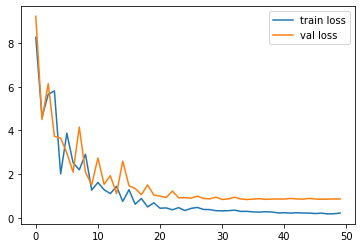

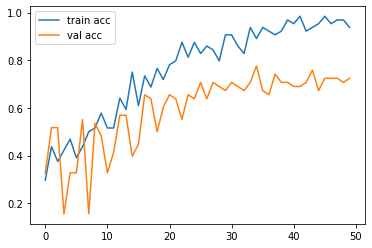

<Figure size 432x288 with 0 Axes>

In [ ]:
# plot the loss
plt.plot(r.history['loss'], label='train loss')
plt.plot(r.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

# plot the accuracy
plt.plot(r.history['accuracy'], label='train acc')
plt.plot(r.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

In [ ]:
# save it as a h5 file


from tensorflow.keras.models import load_model

model.save('model_resnet50.h5')

In [ ]:

y_pred = model.predict(test_set)

2/2 [==============================] - 7s 3s/step


In [ ]:
y_pred

array([[1.00826882e-02, 9.17922378e-01, 7.19947666e-02],
       [1.00747675e-01, 1.72364078e-02, 8.82015884e-01],
       [1.25054084e-03, 7.61197984e-01, 2.37551481e-01],
       [3.72587472e-01, 3.65216821e-01, 2.62195826e-01],
       [1.46118030e-01, 4.20831650e-01, 4.33050305e-01],
       [1.50155634e-01, 5.93881071e-01, 2.55963326e-01],
       [1.69659816e-02, 6.18059099e-01, 3.64974886e-01],
       [1.91966444e-02, 9.44965005e-01, 3.58383432e-02],
       [3.47354263e-02, 4.31890219e-01, 5.33374250e-01],
       [8.25128078e-01, 1.05097353e-01, 6.97745755e-02],
       [7.61338742e-04, 9.92044866e-01, 7.19386386e-03],
       [5.69675788e-02, 3.32972378e-01, 6.10059977e-01],
       [2.31589451e-02, 7.68927574e-01, 2.07913429e-01],
       [4.17702505e-03, 3.59632343e-01, 6.36190593e-01],
       [2.27617081e-02, 4.17014450e-01, 5.60223758e-01],
       [3.06296116e-03, 9.54501867e-01, 4.24351506e-02],
       [9.56599712e-01, 2.13998239e-02, 2.20003743e-02],
       [1.29999354e-01, 6.96883

In [ ]:
import numpy as np
y_pred = np.argmax(y_pred, axis=1)

In [ ]:
y_pred

array([1, 2, 1, 2, 2, 2, 2, 2, 0, 1, 1, 1, 2, 1, 0, 2, 1, 0, 2, 2, 2, 1,
       1, 1, 2, 2, 1, 1, 1, 1, 2, 2, 2, 1, 2, 1, 2, 2, 1, 0, 2, 2, 1, 0,
       2, 1, 0, 1, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2])

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

In [ ]:
model=load_model('model_resnet50.h5')

In [ ]:
# ResNet50 model
loss, acc = model.evaluate(test_set, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

2/2 - 13s - loss: 0.8595 - accuracy: 0.7241 - 13s/epoch - 6s/step
Restored model, accuracy: 72.41%


In [ ]:
img=image.load_img('/content/Test/Test/lamborghini/11.jpg',target_size=(224,224))

In [ ]:
x=image.img_to_array(img)
x

array([[[252., 252., 252.],
        [252., 252., 252.],
        [252., 252., 252.],
        ...,
        [196., 187., 172.],
        [217., 208., 193.],
        [243., 234., 219.]],

       [[252., 252., 252.],
        [252., 252., 252.],
        [252., 252., 252.],
        ...,
        [245., 245., 237.],
        [243., 243., 235.],
        [242., 242., 234.]],

       [[252., 252., 252.],
        [252., 252., 252.],
        [252., 252., 252.],
        ...,
        [240., 249., 248.],
        [242., 251., 250.],
        [242., 251., 250.]],

       ...,

       [[189., 207., 229.],
        [190., 206., 229.],
        [190., 206., 229.],
        ...,
        [171., 180., 187.],
        [171., 180., 187.],
        [171., 180., 187.]],

       [[185., 206., 227.],
        [185., 206., 227.],
        [185., 206., 227.],
        ...,
        [171., 180., 187.],
        [171., 180., 187.],
        [171., 180., 187.]],

       [[185., 206., 227.],
        [185., 206., 227.],
        [185., 2

In [ ]:
x.shape

(224, 224, 3)

In [ ]:
x=x/255

In [ ]:
x=np.expand_dims(x,axis=0)
img_data=preprocess_input(x)
img_data.shape

(1, 224, 224, 3)

In [ ]:
model.predict(img_data)

1/1 [==============================] - 1s 861ms/step


array([[0.18284169, 0.03142177, 0.7857365 ]], dtype=float32)

In [ ]:
a=np.argmax(model.predict(img_data), axis=1)

1/1 [==============================] - 0s 358ms/step


In [ ]:
a==1

array([False])

#3). ResNet101

In [43]:

from tensorflow.keras.applications import ResNet101
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

In [45]:
# Import the Vgg 16 library as shown below and add preprocessing layer
# Here we will be using imagenet weights

r101 = ResNet101(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

171446536/171446536 [==============================] - 1s 0us/step


In [46]:
# don't train existing weights
for layer in r101.layers:
    layer.trainable = False

In [47]:
folders = glob('/content/Train/Train/*')
folders

['/content/Train/Train/mercedes',
 '/content/Train/Train/audi',
 '/content/Train/Train/lamborghini']

In [48]:
x = Flatten()(r101.output)

In [49]:
prediction = Dense(len(folders), activation='softmax')(x)

# create a model object
model_101= Model(inputs=r101.input, outputs=prediction)

In [50]:
model_101.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [51]:
# tell the model what cost and optimization method to use
model_101.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)

In [52]:
# Use the Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

In [53]:
# Make sure you provide the same target size as initialied for the image size
training_set = train_datagen.flow_from_directory('/content/Train/Train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 64 images belonging to 3 classes.


In [54]:
test_set = test_datagen.flow_from_directory('/content/Test/Test',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 58 images belonging to 3 classes.


In [55]:
#modified
# fit the model 

r101 = model_101.fit_generator(
  training_set,
  validation_data=test_set,
  epochs=50,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set)
)

Epoch 1/50
2/2 [==============================] - 67s 40s/step - loss: 4.1965 - accuracy: 0.3125 - val_loss: 9.2133 - val_accuracy: 0.3276
Epoch 2/50
2/2 [==============================] - 64s 51s/step - loss: 8.0851 - accuracy: 0.3906 - val_loss: 1.4523 - val_accuracy: 0.2069
Epoch 3/50
2/2 [==============================] - 45s 33s/step - loss: 1.7733 - accuracy: 0.4688 - val_loss: 4.2909 - val_accuracy: 0.5172
Epoch 4/50
2/2 [==============================] - 44s 32s/step - loss: 3.9064 - accuracy: 0.4375 - val_loss: 3.0252 - val_accuracy: 0.5172
Epoch 5/50
2/2 [==============================] - 44s 32s/step - loss: 2.0524 - accuracy: 0.5469 - val_loss: 1.8491 - val_accuracy: 0.3448
Epoch 6/50
2/2 [==============================] - 64s 51s/step - loss: 2.1147 - accuracy: 0.4375 - val_loss: 1.9984 - val_accuracy: 0.3621
Epoch 7/50
2/2 [==============================] - 63s 51s/step - loss: 1.1573 - accuracy: 0.5469 - val_loss: 1.8317 - val_accuracy: 0.5345
Epoch 8/50
2/2 [===========

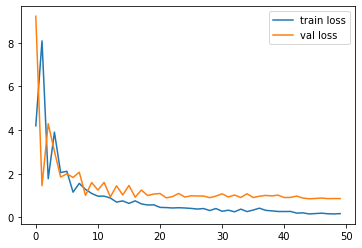

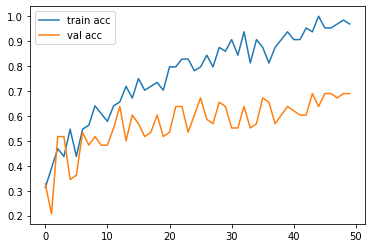

<Figure size 432x288 with 0 Axes>

In [56]:

plt.plot(r101.history['loss'], label='train loss')
plt.plot(r101.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

# plot the accuracy
plt.plot(r101.history['accuracy'], label='train acc')
plt.plot(r101.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

In [57]:
# save it as a h5 file


from tensorflow.keras.models import load_model

model_101.save('model_resnet101.h5')

In [58]:

loss, acc = model_101.evaluate(test_set, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

2/2 - 20s - loss: 0.8623 - accuracy: 0.6897 - 20s/epoch - 10s/step
Restored model, accuracy: 68.97%


In [60]:
y_pred = model_101.predict(test_set)

2/2 [==============================] - 24s 10s/step


In [61]:
y_pred

array([[7.50425085e-02, 8.55974972e-01, 6.89824671e-02],
       [1.93008840e-01, 6.39201045e-01, 1.67789996e-01],
       [9.63064358e-02, 7.17347085e-01, 1.86346516e-01],
       [1.30493846e-02, 9.18928206e-01, 6.80224225e-02],
       [6.37642860e-01, 3.31773430e-01, 3.05836871e-02],
       [1.34958193e-01, 5.48766255e-01, 3.16275567e-01],
       [1.66358605e-01, 5.70702732e-01, 2.62938678e-01],
       [1.26635758e-02, 8.53672504e-01, 1.33663863e-01],
       [4.29854244e-01, 1.87409844e-03, 5.68271637e-01],
       [9.82172205e-04, 9.93640423e-01, 5.37738157e-03],
       [6.28187597e-01, 3.38640134e-03, 3.68426025e-01],
       [3.19224089e-01, 5.57532869e-02, 6.25022650e-01],
       [1.17293619e-01, 1.94993794e-01, 6.87712550e-01],
       [1.51436497e-02, 9.22079980e-01, 6.27764016e-02],
       [4.04039681e-01, 1.91447854e-01, 4.04512376e-01],
       [3.70128393e-01, 3.37789387e-01, 2.92082131e-01],
       [1.12605773e-01, 8.74256968e-01, 1.31373182e-02],
       [5.34307472e-02, 8.64683

#4). VGG-16 classifier

In [ ]:
# Here we will be using imagenet weights

vgg16 = VGG16(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

Here we should train our layers as we are using the model that is pretrained

In [ ]:
# don't train existing weights
for layer in vgg16.layers:
    layer.trainable = False

In [ ]:
folders = glob('/content/Train/Train/*')
folders

['/content/Train/Train/lamborghini',
 '/content/Train/Train/mercedes',
 '/content/Train/Train/audi']

In [ ]:
len(folders)

3

In [ ]:
x = Flatten()(vgg16.output)

In [ ]:
prediction = Dense(len(folders), activation='softmax')(x)

# create a model object
model_v = Model(inputs=vgg16.input, outputs=prediction)

In [ ]:
model_v.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
# tell the model what cost and optimization method to use
model_v.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)

In [ ]:
# Use the Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

In [ ]:
# Make sure you provide the same target size as initialied for the image size
training_set = train_datagen.flow_from_directory('/content/Train/Train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 64 images belonging to 3 classes.


In [ ]:
test_set = test_datagen.flow_from_directory('/content/Test/Test',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 58 images belonging to 3 classes.


In [ ]:
#modified
# fit the model 

v = model_v.fit_generator(
  training_set,
  validation_data=test_set,
  epochs=50,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set)
)

Epoch 1/50
2/2 [==============================] - 92s 65s/step - loss: 2.2411 - accuracy: 0.2031 - val_loss: 1.8951 - val_accuracy: 0.3448
Epoch 2/50
2/2 [==============================] - 131s 105s/step - loss: 1.8073 - accuracy: 0.4219 - val_loss: 0.9406 - val_accuracy: 0.5172
Epoch 3/50
2/2 [==============================] - 83s 60s/step - loss: 1.0900 - accuracy: 0.5938 - val_loss: 1.4879 - val_accuracy: 0.5000
Epoch 4/50
2/2 [==============================] - 85s 64s/step - loss: 0.9339 - accuracy: 0.6719 - val_loss: 0.8976 - val_accuracy: 0.6724
Epoch 5/50
2/2 [==============================] - 80s 58s/step - loss: 0.4226 - accuracy: 0.8125 - val_loss: 0.5833 - val_accuracy: 0.7586
Epoch 6/50
2/2 [==============================] - 127s 102s/step - loss: 0.4613 - accuracy: 0.8281 - val_loss: 0.6721 - val_accuracy: 0.6897
Epoch 7/50
2/2 [==============================] - 84s 61s/step - loss: 0.3680 - accuracy: 0.8438 - val_loss: 0.4445 - val_accuracy: 0.8966
Epoch 8/50
2/2 [=======

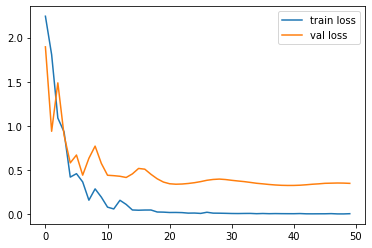

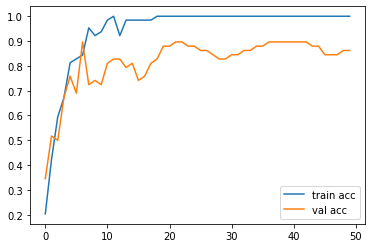

<Figure size 432x288 with 0 Axes>

In [ ]:

plt.plot(v.history['loss'], label='train loss')
plt.plot(v.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

# plot the accuracy
plt.plot(v.history['accuracy'], label='train acc')
plt.plot(v.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

In [ ]:
# save it as a h5 file


from tensorflow.keras.models import load_model

model_v.save('model_vgg16.h5')

In [ ]:

loss, acc = model_v.evaluate(test_set, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

2/2 - 38s - loss: 0.3518 - accuracy: 0.8621 - 38s/epoch - 19s/step
Restored model, accuracy: 86.21%


In [ ]:
y_pred = model_v.predict(test_set)

2/2 [==============================] - 36s 16s/step


In [ ]:
y_pred

array([[7.15399861e-01, 2.43222654e-01, 4.13774140e-02],
       [9.34145646e-05, 9.96893048e-01, 3.01356171e-03],
       [7.76418805e-01, 1.80509419e-03, 2.21776053e-01],
       [2.21225819e-05, 9.99872684e-01, 1.05126266e-04],
       [3.28390561e-02, 5.03645778e-01, 4.63515192e-01],
       [4.48412448e-01, 3.63259041e-03, 5.47955036e-01],
       [1.20221695e-03, 9.89729583e-01, 9.06809140e-03],
       [1.68161481e-04, 9.99189913e-01, 6.41863095e-04],
       [3.54116404e-04, 9.79425251e-01, 2.02206280e-02],
       [6.33314475e-02, 1.57300159e-01, 7.79368401e-01],
       [2.34120235e-01, 5.22345398e-03, 7.60656357e-01],
       [3.25223693e-04, 9.98977184e-01, 6.97633252e-04],
       [1.48340501e-02, 9.17657435e-01, 6.75084963e-02],
       [9.78287816e-01, 3.09944473e-04, 2.14021485e-02],
       [1.65563868e-03, 9.97042060e-01, 1.30224391e-03],
       [4.80938479e-02, 1.08891040e-01, 8.43015075e-01],
       [4.48940188e-01, 3.41100320e-02, 5.16949773e-01],
       [1.12334755e-03, 9.66510

#5). VGG-19 classifier

In [ ]:
# Here we will be using imagenet weights

vgg19 = VGG19(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

80134624/80134624 [==============================] - 0s 0us/step


In [ ]:
# don't train existing weights
for layer in vgg19.layers:
    layer.trainable = False

In [ ]:
folders = glob('/content/Train/Train/*')
folders

['/content/Train/Train/lamborghini',
 '/content/Train/Train/mercedes',
 '/content/Train/Train/audi']

In [ ]:
len(folders)

3

In [ ]:
x = Flatten()(vgg19.output)

In [ ]:
prediction = Dense(len(folders), activation='softmax')(x)

# create a model object
model_vg = Model(inputs=vgg19.input, outputs=prediction)

In [ ]:
model_vg.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

In [ ]:
# tell the model what cost and optimization method to use
model_vg.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)

In [ ]:
# Use the Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

In [ ]:
# Make sure you provide the same target size as initialied for the image size
training_set = train_datagen.flow_from_directory('/content/Train/Train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 64 images belonging to 3 classes.


In [ ]:
test_set = test_datagen.flow_from_directory('/content/Test/Test',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 58 images belonging to 3 classes.


In [ ]:
#modified
# fit the model 

vg = model_vg.fit_generator(
  training_set,
  validation_data=test_set,
  epochs=50,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set)
)

Epoch 1/50
2/2 [==============================] - 110s 82s/step - loss: 2.2205 - accuracy: 0.3750 - val_loss: 4.1625 - val_accuracy: 0.1552
Epoch 2/50
2/2 [==============================] - 133s 108s/step - loss: 2.0242 - accuracy: 0.4375 - val_loss: 0.7747 - val_accuracy: 0.6724
Epoch 3/50
2/2 [==============================] - 134s 108s/step - loss: 1.0723 - accuracy: 0.5625 - val_loss: 1.1819 - val_accuracy: 0.5517
Epoch 4/50
2/2 [==============================] - 132s 108s/step - loss: 0.9776 - accuracy: 0.5938 - val_loss: 0.7198 - val_accuracy: 0.6897
Epoch 5/50
2/2 [==============================] - 93s 67s/step - loss: 0.4429 - accuracy: 0.7969 - val_loss: 0.9342 - val_accuracy: 0.6207
Epoch 6/50
2/2 [==============================] - 131s 107s/step - loss: 0.6634 - accuracy: 0.7188 - val_loss: 1.0032 - val_accuracy: 0.5862
Epoch 7/50
2/2 [==============================] - 132s 107s/step - loss: 0.4216 - accuracy: 0.8438 - val_loss: 0.5075 - val_accuracy: 0.8621
Epoch 8/50
2/2 [

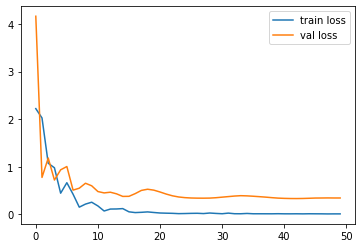

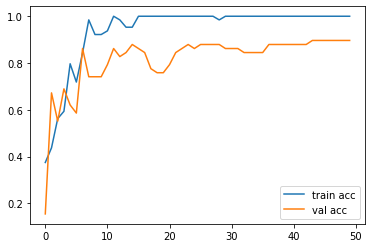

<Figure size 432x288 with 0 Axes>

In [ ]:

plt.plot(vg.history['loss'], label='train loss')
plt.plot(vg.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

# plot the accuracy
plt.plot(vg.history['accuracy'], label='train acc')
plt.plot(vg.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

In [ ]:

# save it as a h5 file


from tensorflow.keras.models import load_model

model_vg.save('model_vgg19.h5')

In [ ]:

loss, acc = model_vg.evaluate(test_set, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

2/2 - 50s - loss: 0.3421 - accuracy: 0.8966 - 50s/epoch - 25s/step
Restored model, accuracy: 89.66%


In [ ]:
y_pred = model_vg.predict(test_set)

2/2 [==============================] - 44s 21s/step


In [ ]:
y_pred

In [ ]:
import numpy as np
y_pred = np.argmax(y_pred, axis=1)

In [ ]:
y_pred

#6). Inception-V3

In [ ]:

import os
import zipfile
import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras import Model

In [ ]:
# Import the inception model  
from tensorflow.keras.applications.inception_v3 import InceptionV3

In [ ]:
IV3 = InceptionV3(input_shape=IMAGE_SIZE + [3], # Shape of our images
                                include_top = False, # Leave out the last fully connected layer
                                weights = 'imagenet')

87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
for layer in IV3.layers:
  layer.trainable = False

In [ ]:
folders = glob('/content/Train/Train/*')
folders

['/content/Train/Train/lamborghini',
 '/content/Train/Train/mercedes',
 '/content/Train/Train/audi']

In [ ]:
from tensorflow.keras.optimizers import RMSprop

# Flatten the output layer to 1 dimension
x = layers.Flatten()(IV3.output)

In [ ]:
prediction = Dense(len(folders), activation='softmax')(x)

# create a model object
model_i = Model(inputs=IV3.input, outputs=prediction)

In [ ]:
model_i.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_3 (Conv2D)              (None, 111, 111, 32  864         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d_3[0][0]']               
 alization)                     )                                                           

In [ ]:
# tell the model what cost and optimization method to use
model_i.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)

In [ ]:
# Use the Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

In [ ]:
# Make sure you provide the same target size as initialied for the image size
training_set = train_datagen.flow_from_directory('/content/Train/Train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 64 images belonging to 3 classes.


In [ ]:
test_set = test_datagen.flow_from_directory('/content/Test/Test',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 58 images belonging to 3 classes.


In [ ]:
#modified
# fit the model 

i = model_i.fit_generator(
  training_set,
  validation_data=test_set,
  epochs=50,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set)
)

Epoch 1/50
2/2 [==============================] - 34s 13s/step - loss: 3.7614 - accuracy: 0.4844 - val_loss: 10.7433 - val_accuracy: 0.1724
Epoch 2/50
2/2 [==============================] - 20s 14s/step - loss: 3.9927 - accuracy: 0.5938 - val_loss: 3.6363 - val_accuracy: 0.6379
Epoch 3/50
2/2 [==============================] - 18s 14s/step - loss: 4.8596 - accuracy: 0.5781 - val_loss: 3.0267 - val_accuracy: 0.7414
Epoch 4/50
2/2 [==============================] - 19s 15s/step - loss: 2.2019 - accuracy: 0.7500 - val_loss: 0.7871 - val_accuracy: 0.8448
Epoch 5/50
2/2 [==============================] - 21s 14s/step - loss: 0.1879 - accuracy: 0.9375 - val_loss: 2.7336 - val_accuracy: 0.6207
Epoch 6/50
2/2 [==============================] - 20s 14s/step - loss: 1.2359 - accuracy: 0.8438 - val_loss: 2.9385 - val_accuracy: 0.5517
Epoch 7/50
2/2 [==============================] - 20s 16s/step - loss: 1.5253 - accuracy: 0.8125 - val_loss: 1.9158 - val_accuracy: 0.7241
Epoch 8/50
2/2 [==========

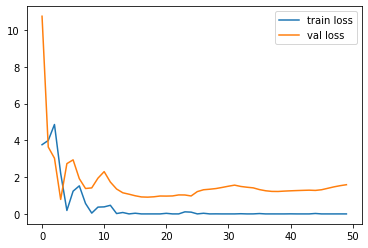

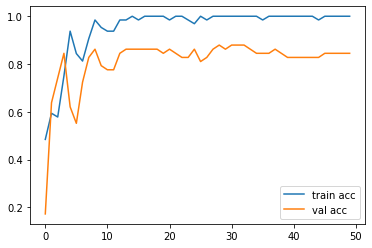

<Figure size 432x288 with 0 Axes>

In [ ]:

plt.plot(i.history['loss'], label='train loss')
plt.plot(i.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

# plot the accuracy
plt.plot(i.history['accuracy'], label='train acc')
plt.plot(i.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

In [ ]:
# save it as a h5 file


from tensorflow.keras.models import load_model

model_i.save('model_inceptionV3.h5')

In [ ]:

loss, acc = model_i.evaluate(test_set, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

2/2 - 9s - loss: 1.5872 - accuracy: 0.8448 - 9s/epoch - 4s/step
Restored model, accuracy: 84.48%


In [ ]:
y_pred = model_i.predict(test_set)

2/2 [==============================] - 10s 5s/step


In [ ]:
y_pred

array([[2.96738181e-05, 1.29802114e-10, 9.99970257e-01],
       [5.18716224e-05, 3.41652218e-09, 9.99948084e-01],
       [1.45017783e-20, 9.99999940e-01, 5.48359101e-13],
       [1.13875070e-16, 4.32673346e-08, 9.99999940e-01],
       [9.99995410e-01, 6.76359637e-24, 4.55406325e-06],
       [8.24598246e-04, 1.58341645e-05, 9.99159515e-01],
       [1.87090562e-15, 9.99999821e-01, 7.10920958e-08],
       [1.29880891e-23, 9.99999940e-01, 5.20204067e-16],
       [3.41083932e-11, 9.99825478e-01, 1.74576810e-04],
       [7.26294994e-01, 9.59508029e-10, 2.73704976e-01],
       [3.61494463e-29, 9.99999940e-01, 7.68435965e-25],
       [1.46541239e-16, 8.71975007e-18, 9.99999940e-01],
       [8.00738462e-08, 9.42682195e-03, 9.90573049e-01],
       [9.81593330e-05, 9.99785900e-01, 1.15811279e-04],
       [9.88933027e-01, 3.23210686e-12, 1.10668931e-02],
       [3.14944408e-08, 5.50528290e-10, 9.99999940e-01],
       [6.76466101e-08, 1.42937438e-07, 9.99999702e-01],
       [2.92847268e-16, 9.99999

#7). Xception

In [31]:
from tensorflow.keras.applications import Xception
from tensorflow.keras import Input, Model, optimizers, losses, metrics
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [38]:

import os
import zipfile
import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras import Model

In [32]:
Xcept = Xception(
    include_top = False,
    weights = 'imagenet',
    input_shape=IMAGE_SIZE + [3],
)

83683744/83683744 [==============================] - 1s 0us/step


In [33]:
for layer in Xcept.layers:
  layer.trainable = False

In [34]:
folders = glob('/content/Train/Train/*')
folders

['/content/Train/Train/mercedes',
 '/content/Train/Train/audi',
 '/content/Train/Train/lamborghini']

In [39]:
from tensorflow.keras.optimizers import RMSprop

# Flatten the output layer to 1 dimension
x = layers.Flatten()(Xcept.output)

In [40]:
prediction = Dense(len(folders), activation='softmax')(x)

# create a model object
model_x= Model(inputs=Xcept.input, outputs=prediction)

In [41]:
model_x.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                             

In [42]:
# tell the model what cost and optimization method to use
model_x.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)

In [43]:
# Use the Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

In [44]:
# Make sure you provide the same target size as initialied for the image size
training_set = train_datagen.flow_from_directory('/content/Train/Train',
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 64 images belonging to 3 classes.


In [45]:
test_set = test_datagen.flow_from_directory('/content/Test/Test',
                                            target_size = (224, 224),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 58 images belonging to 3 classes.


In [46]:
#modified
# fit the model 

x = model_x.fit_generator(
  training_set,
  validation_data=test_set,
  epochs=50,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set)
)

Epoch 1/50
2/2 [==============================] - 40s 30s/step - loss: 4.4194 - accuracy: 0.4688 - val_loss: 5.1987 - val_accuracy: 0.2241
Epoch 2/50
2/2 [==============================] - 37s 23s/step - loss: 2.4795 - accuracy: 0.5781 - val_loss: 4.4624 - val_accuracy: 0.6207
Epoch 3/50
2/2 [==============================] - 36s 28s/step - loss: 2.7891 - accuracy: 0.6562 - val_loss: 3.2717 - val_accuracy: 0.7069
Epoch 4/50
2/2 [==============================] - 36s 27s/step - loss: 2.1090 - accuracy: 0.7188 - val_loss: 1.4091 - val_accuracy: 0.7414
Epoch 5/50
2/2 [==============================] - 29s 20s/step - loss: 0.5015 - accuracy: 0.8750 - val_loss: 2.3842 - val_accuracy: 0.7069
Epoch 6/50
2/2 [==============================] - 36s 27s/step - loss: 0.8853 - accuracy: 0.8438 - val_loss: 2.9343 - val_accuracy: 0.6552
Epoch 7/50
2/2 [==============================] - 37s 28s/step - loss: 0.7806 - accuracy: 0.8438 - val_loss: 1.3403 - val_accuracy: 0.8276
Epoch 8/50
2/2 [===========

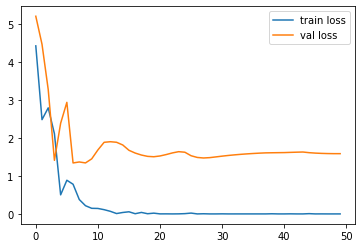

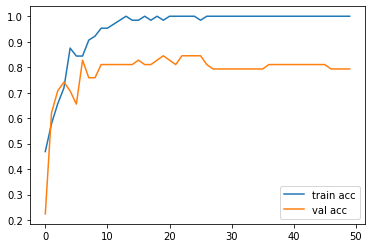

<Figure size 432x288 with 0 Axes>

In [47]:

plt.plot(x.history['loss'], label='train loss')
plt.plot(x.history['val_loss'], label='val loss')
plt.legend()
plt.show()
plt.savefig('LossVal_loss')

# plot the accuracy
plt.plot(x.history['accuracy'], label='train acc')
plt.plot(x.history['val_accuracy'], label='val acc')
plt.legend()
plt.show()
plt.savefig('AccVal_acc')

In [48]:
# save it as a h5 file


from tensorflow.keras.models import load_model

model_x.save('model_Xception.h5')

In [49]:

loss, acc = model_x.evaluate(test_set, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

2/2 - 26s - loss: 1.5847 - accuracy: 0.7931 - 26s/epoch - 13s/step
Restored model, accuracy: 79.31%


In [50]:
y_pred = model_x.predict(test_set)

2/2 [==============================] - 16s 5s/step


In [51]:
y_pred

array([[9.9998230e-01, 7.5484055e-09, 1.7615941e-05],
       [3.6366961e-09, 2.1492019e-07, 9.9999970e-01],
       [8.4331207e-13, 9.9999994e-01, 1.1969890e-08],
       [9.6784606e-06, 1.8387121e-12, 9.9999028e-01],
       [1.7782851e-22, 9.9999994e-01, 5.1929199e-24],
       [6.4923888e-01, 3.4882781e-01, 1.9333032e-03],
       [1.2051403e-11, 9.9999994e-01, 4.4390653e-08],
       [3.9015076e-06, 9.9999601e-01, 4.1877266e-10],
       [2.2251261e-02, 7.5982069e-04, 9.7698897e-01],
       [1.6027548e-18, 9.9999994e-01, 8.2609707e-14],
       [1.8554594e-02, 2.3672696e-08, 9.8144531e-01],
       [4.2600179e-04, 9.9204781e-06, 9.9956411e-01],
       [9.9999756e-01, 3.3851115e-18, 2.3465980e-06],
       [1.4796686e-07, 9.9999982e-01, 1.1223195e-09],
       [3.7668257e-23, 9.9999994e-01, 1.3933962e-17],
       [9.9361168e-06, 2.0514186e-20, 9.9999005e-01],
       [8.6213111e-12, 9.9999994e-01, 1.7590320e-08],
       [5.0408527e-25, 9.9999994e-01, 1.8527447e-12],
       [7.4143813e-04, 5.940

#Results analysis

In [52]:
import pandas as pd
Result_Table = pd.DataFrame({'Model':['Base_model','Resnet-50','ResNet101','VGG-16','VGG-19','Inception-V3','Xception'],'Accuracy (%)':[56.90,72.41,68.97,86.21,89.66,84.48, 79.31]})

In [53]:
Result_Table

,Model,Accuracy (%)
0,Base_model,56.90
1,Resnet-50,72.41
2,ResNet101,68.97
3,VGG-16,86.21
4,VGG-19,89.66
5,Inception-V3,84.48
6,Xception,79.31


#Others

In [ ]:
# Assign label names to the corresponding indexes
labels = {
    0: 'mercedes', 
    1: 'lamborghini', 
    2: 'audi'
}

In [ ]:
# Load images and their predictions 

prediction = []
original = []
image = []
count = 0
for i in os.listdir(dir_path1):
    for item in os.listdir(os.path.join(dir_path1,i)):
        # code to open the image
        img= PIL.Image.open(os.path.join(dir_path1, i, item))
        # resizing the image to (224,224)
        img = img.resize((224, 224))
        # appending image to the image list
        image.append(img)
        # converting image to array
        img = np.asarray(img, dtype = np.float32)
        # normalizing the image
        img = img / 255
        # reshaping the image into a 4D array
        img = img.reshape(-1, 224, 224, 3)
        # making prediction of the model
        predict = model.predict(img)
        # getting the index corresponding to the highest value in the prediction
        predict = np.argmax(predict)
        # appending the predicted class to the list
        prediction.append(labels[predict])
        # appending original class to the list
        original.append(i)

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [ ]:
# Get the test accuracy 
score = accuracy_score(original, prediction)
print("Test Accuracy : {}".format(score))

In [ ]:
# Check out the Classification Report 
print(classification_report(np.asarray(prediction), np.asarray(original)))

# Based on these values, you can try t improve your model.
# For the sake of simplicity, hyperparameter tuning and model improvement was not done.

In [ ]:
import seaborn as sns

In [ ]:
# View the 6x6 confusion matrix
plt.figure(figsize = (7, 5))
cm = confusion_matrix(np.asarray(prediction), np.asarray(original))
sns.heatmap(
    cm,
    annot = True,
    fmt = "d"
)
plt.show()

#Image Explainability Techiniques

#1). Local interpretable model-agnostic explanations (LIME)

LIME stands for Local Interpretable Model-agnostic Explanations. LIME focuses on training local surrogate models to explain individual predictions. Local surrogate models are interpretable models that are used to explain individual predictions of black box machine learning models. Surrogate models are trained to approximate the predictions of the underlying black box model.

Instead of training a global surrogate model, LIME focuses on training local surrogate models.LIME is model-agnostic, meaning that it can be applied to any machine learning model. The technique attempts to understand the model by perturbing the input of data samples and understanding how the predictions change.

Model-specific approaches aim to understand the black model machine learning model by analysing the internal components and how they interact. LIME provides local model interpretability. LIME modifies a single data sample by tweaking the feature values and observes the resulting impact on the output. The most common question is probably: why was this prediction made or which variables caused the prediction.

In [ ]:
from tensorflow.keras.applications import inception_v3 as inc_net

In [ ]:
inet_model = inc_net.InceptionV3()

In [ ]:
from tensorflow.keras.utils import img_to_array

In [ ]:

def transform_img_fn(path_list):
    out = []
    for img_path in path_list:
        img = tf.keras.utils.load_img(img_path, target_size=(299,299))
        x = img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = inc_net.preprocess_input(x)
        out.append(x)
    return np.vstack(out)

In [ ]:
from keras.applications.imagenet_utils import decode_predictions

35363/35363 [==============================] - 0s 0us/step
('n04285008', 'sports_car', 0.67782336)
('n03100240', 'convertible', 0.09899413)
('n03459775', 'grille', 0.045235045)
('n04037443', 'racer', 0.010862967)
('n02974003', 'car_wheel', 0.0036673562)


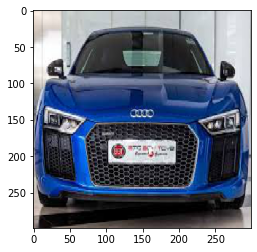

In [ ]:
images = transform_img_fn([os.path.join('/content/Train/Train','audi/1.jpg')])
# I'm dividing by 2 and adding 0.5 because of how this Inception represents images
plt.imshow(images[0] / 2 + 0.5)
preds = inet_model.predict(images)
for x in decode_predictions(preds)[0]:
    print(x)

In [ ]:
pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import lime

In [ ]:
from lime import lime_image

In [ ]:
explainer = lime_image.LimeImageExplainer()

In [ ]:
from skimage import io
from tensorflow.keras.preprocessing import image

In [ ]:

%load_ext autoreload
%autoreload 2
import os,sys
try:
    import lime
except:
    sys.path.append(os.path.join('..', '..')) # add the current directory
    import lime
from lime import lime_image

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:

%%time
# Hide color is the color for a superpixel turned OFF. Alternatively, if it is NONE, the superpixel will be replaced by the average of its pixels
explanation = explainer.explain_instance(images[0].astype('double'), inet_model.predict, top_labels=5, hide_color=0, num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step
CPU times: user 4min 38s, sys: 9.6 s, total: 4min 48s
Wall time: 3min 37s


In [ ]:
explanation

In [ ]:
from skimage.segmentation import mark_boundaries

Superpixel for the topmost prediction

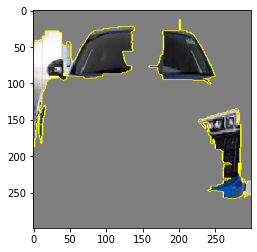

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=True)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

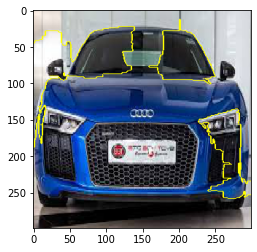

In [ ]:

temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

Visualizing 'pros and cons'

a). pros in green  
b). cons in pink

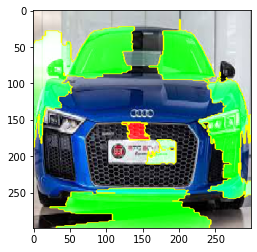

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

Pros and cons

With weight at least 0.1

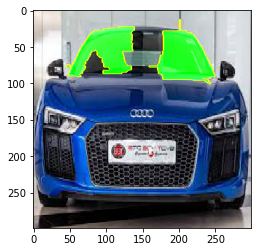

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

Explaination Heatmap plot with weights

Colorbar shows the value of the weights

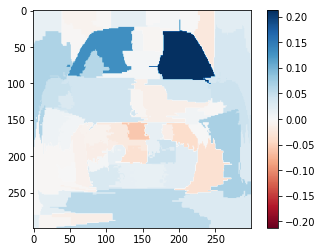

In [ ]:

#Select the same class explained on the figures above.
ind =  explanation.top_labels[0]

#Map each explanation weight to the corresponding superpixel
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments) 

#Plot. The visualization makes more sense if a symmetrical colorbar is used.
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()

Second Prediction in the list

Superpixel for the second most Prediction

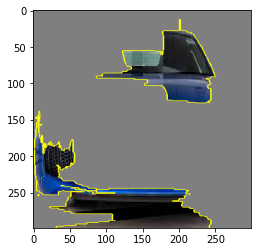

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=True, num_features=5, hide_rest=True)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

Rest of the image from the second prediction

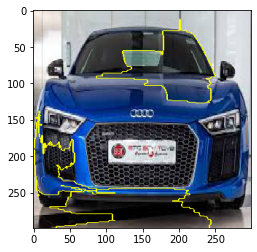

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=True, num_features=5, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

Visualizing 'pros and cons'

a). pros in green  
b). cons in pink

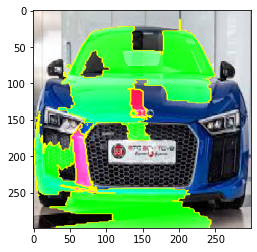

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=False, num_features=10, hide_rest=False)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

Pros and cons

that have weight at least 0.1

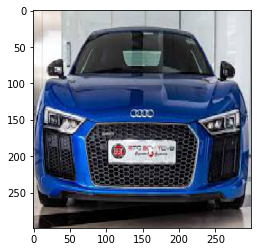

In [ ]:
temp, mask = explanation.get_image_and_mask(explanation.top_labels[1], positive_only=False, num_features=1000, hide_rest=False, min_weight=0.1)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

Explanation Heatmap plot with weights

Colorbar shows the values of the weights.

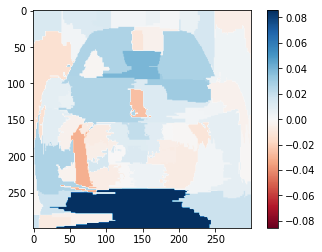

In [ ]:

#Select the same class explained on the figures above.
ind =  explanation.top_labels[1]

#Map each explanation weight to the corresponding superpixel
dict_heatmap = dict(explanation.local_exp[ind])
heatmap = np.vectorize(dict_heatmap.get)(explanation.segments) 

#Plot. The visualization makes more sense if a symmetrical colorbar is used.
plt.imshow(heatmap, cmap = 'RdBu', vmin  = -heatmap.max(), vmax = heatmap.max())
plt.colorbar()

#2). Gradient-weighted Class Activation Mapping (GRAD-CAM)


Grad-CAM is a CNN model explanation technique which helps in visualizing the regions of the image where the CNN model is looking at for classification.
In this technique, gradients flows through the last convolution layer to produce a coarse localization map highlighting the important regions in the image for predicting the concept.
It is based on the research paper "Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization"

In [ ]:
model_vgg = load_model('/content/model_vgg19.h5')

In [ ]:
img1 = "/content/Train/Train/audi/1.jpg"
img2 = "/content/Test/Test/lamborghini/1.jpg"
img3 = "/content/Test/Test/merc

In [ ]:
img_path = '/content/Train/Train/audi/1.jpg'
img = Image.open(img_path).resize((224,224)) #target_size must agree with what the trained model expects!!

# Preprocessing the image
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img = img.astype('float32')/255

In [ ]:
def pred_image(img_path,model):
  img = Image.open(img_path).resize((224,224)) #target_size must agree with what the trained model expects!!
  # Preprocessing the image
  img = image.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  img = img.astype('float32')/255
  
  preds = model_vgg.predict(img)[0]
  prediction = sorted(
      [(labels[i], round(j*100, 2)) for i, j in enumerate(preds)],
      reverse=True,
      key=lambda x: x[1]
  )
  
  return prediction

In [ ]:
pred_image(img1, model_vgg)

1/1 [==============================] - 0s 381ms/step


[('mercedes', 99.96), ('audi', 0.03), ('lamborghini', 0.01)]

In [ ]:
import tensorflow as tf
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [ ]:
# Prepare image
img_size=(224,224)

img = Image.open(img1).resize((224,224)) #target_size must agree with what the trained model expects!!

# Preprocessing the image
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)
img = img.astype('float32')/255

# Remove last layer's softmax
model.layers[-1].activation = None

# Print what the top predicted class is
preds = model.predict(img)

1/1 [==============================] - 0s 385ms/step


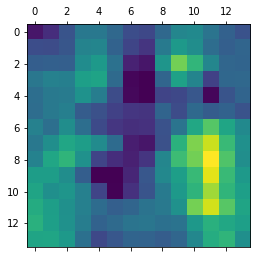

In [ ]:
# Generate class activation heatmap
last_conv_layer_name = "block5_conv3"
heatmap = make_gradcam_heatmap(img, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

In [ ]:
def generate_heatmap(img_path,last_conv_layer_name):
  # Prepare image
  img_size=(224,224)

  img = Image.open(img_path).resize((224,224)) #target_size must agree with what the trained model expects!!
  img = image.img_to_array(img)
  img = np.expand_dims(img, axis=0)
  img = img.astype('float32')/255

  # Remove last layer's softmax
  model.layers[-1].activation = None
  heatmap = make_gradcam_heatmap(img, model, last_conv_layer_name)

  return heatmap

In [ ]:
heatmap =generate_heatmap(img1,"block5_conv3")

In [ ]:
from IPython.display import Image as imgdisp, display
def save_and_display_gradcam(img_path, heatmap, cam_path="/content/cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)
    

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(imgdisp(cam_path))

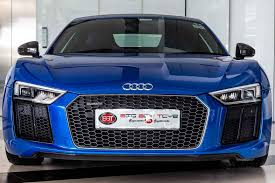

In [ ]:
display(imgdisp(img1))

In [ ]:
import pandas as pd
#math operations
import numpy as np
#machine learning
import cv2                     
import os                  
from tqdm import tqdm  
import random
#for opening and loading image
from PIL import Image
#for preprocessing
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
#Doing One hot encoding as classifier has multiple classes
from random import shuffle
#MobileNetV2 model
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras import Model, layers
from numpy import loadtxt
from tensorflow.keras.applications.imagenet_utils import preprocess_input, decode_predictions
from tensorflow.keras.models import load_model



import matplotlib.pyplot as plt
import matplotlib.cm as cm
import tensorflow as tf

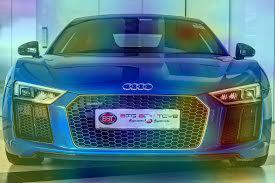

In [ ]:
heatmap =generate_heatmap(img1,"block5_conv3")
save_and_display_gradcam(img1, heatmap)